<div style="background-color: #0047AB; padding: 20px; border-radius: 10px;">
  <h1 style="color: white; font-size: 30px; font-weight: bold; text-align: center;">Olympics Data Analysis
</h1>
</div>

# Team Name: Strategy Stars  

## Team Members:  
Hitha Choudhary G  
K Shreeshanth  
Lakshya Sharma  

# Importing Necessary Libraries

In [1]:
import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import warnings # handle warning messages
warnings.filterwarnings('ignore') # Ignore warning messages

C:\Users\hithachoudhary\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\hithachoudhary\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


# Data Loading and Exploration  

This step includes:    
1.Reviewing the first lines of the data  
2.Gathering datatypes,column names,statistical information and other information using the .describe() and .info() functions  
3.Identifying missing values    

Note: This dataset contains two csv files and hence we'll be exploring each file on it's own before merging it

In [2]:
athlete=pd.read_csv("athlete_events.csv")
noc=pd.read_csv("noc_regions.csv")

### 1.Athlete Events data  

In [3]:
#Reviewing the dataframe

athlete_df=pd.DataFrame(athlete)
athlete_df

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,NaN
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",NaN
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN


In [4]:
#Getting the shape of the data

rows,columns = athlete_df.shape
print("The number of rows:",rows,"\nThe number of columns:",columns)

The number of rows: 271116 
The number of columns: 15


In [5]:
#Getting the column names and their datatypes

column_names,dtypes = athlete_df.columns, athlete_df.dtypes
print("The columns present in the dataset are:\n",column_names,"\n\nThe dataypes of each column:\n",dtypes)

The columns present in the dataset are:
 Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal'],
      dtype='object') 

The dataypes of each column:
 ID          int64
Name       object
Sex        object
Age       float64
Height    float64
Weight    float64
Team       object
NOC        object
Games      object
Year        int64
Season     object
City       object
Sport      object
Event      object
Medal      object
dtype: object


In [6]:
#Extracting the information about the dataset

athlete_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [7]:
#Displaying the descriptive statistics 

athlete_df.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.338970,70.702393,1978.378480
std,39022.286345,6.393561,10.518462,14.348020,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


In [8]:
#Counting the total number of null values present in each column

athlete_df.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

<AxesSubplot:>

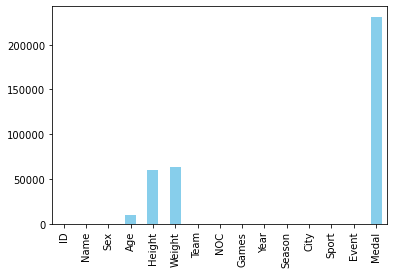

In [9]:
#Visualizing the above code

athlete_df.isnull().sum().plot(kind='bar',color='skyblue')

### 2.NOC Regions data

In [10]:
#Reviewing the dataframe

noc_df=pd.DataFrame(noc)
noc_df

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN
...,...,...,...
225,YEM,Yemen,NaN
226,YMD,Yemen,South Yemen
227,YUG,Serbia,Yugoslavia
228,ZAM,Zambia,NaN


In [11]:
#Getting the shape of the data

rows,columns = noc_df.shape
print("The number of rows:",rows,"\nThe number of columns:",columns)

The number of rows: 230 
The number of columns: 3


In [12]:
#Getting the column names and their datatypes

column_names,dtypes = noc_df.columns, noc_df.dtypes
print("The columns present in the dataset are:\n",column_names,"\n\nThe datatypes of each column: \n",dtypes)

The columns present in the dataset are:
 Index(['NOC', 'region', 'notes'], dtype='object') 

The datatypes of each column: 
 NOC       object
region    object
notes     object
dtype: object


In [13]:
#Extracting the information about the dataset

noc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   NOC     230 non-null    object
 1   region  227 non-null    object
 2   notes   21 non-null     object
dtypes: object(3)
memory usage: 5.5+ KB


In [14]:
#Counting the total number of null values present in each column

noc_df.isnull().sum()

NOC         0
region      3
notes     209
dtype: int64

<AxesSubplot:>

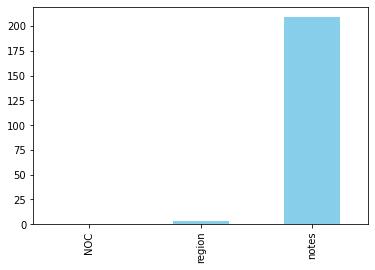

In [15]:
#Visualizing the above code

noc_df.isnull().sum().plot(kind='bar',color='skyblue')

# Merging the DataFrames  

Now we will merge the athletes dataframe with the region dataframes on NOC column.

In [16]:
olympics_df = athlete_df.merge(noc_df, on="NOC", how='left')
olympics_df

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,NaN,Poland,NaN
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",NaN,Poland,NaN
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN,Poland,NaN
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN,Poland,NaN


In [17]:
olympics_df.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.338970,70.702393,1978.378480
std,39022.286345,6.393561,10.518462,14.348020,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


# Data Cleaning and Preparation

This section includes cleaning of the data, namely handling missing values and inconsistencies to ensure the data is ready for further analysis.

In [18]:
olympics_df.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
region       370
notes     266077
dtype: int64

In [19]:
#Filling the missing values in 'region','notes' and medal' column

olympics_df['region'].fillna('Not Available', inplace=True)
olympics_df['notes'].fillna('Not Available', inplace=True)
olympics_df['Medal'].fillna('No Medal', inplace=True)

#Checking the sumofmissing values after imputation
print("Sum of missing values in region column after imputation: ",olympics_df['region'].isnull().sum())
print("Sum of missing values in notes column after imputation: ",olympics_df['region'].isnull().sum())
print("Sum of missing values in Medal column after imputation: ",olympics_df['Medal'].isnull().sum())

Sum of missing values in region column after imputation:  0
Sum of missing values in notes column after imputation:  0
Sum of missing values in Medal column after imputation:  0


In [20]:
# Calculate skewness to determine which imputation method is appropriate for each of these columns

skewness_age = olympics_df["Age"].skew()
skewness_height = olympics_df["Height"].skew()
skewness_weight = olympics_df["Weight"].skew()

# Print the skewness value
print("Skewness of Age column:",skewness_age)
print("Skewness of Height column:",skewness_height)
print("Skewness of Weight column:",skewness_weight)

Skewness of Age column: 1.747122537787137
Skewness of Height column: 0.018477298234269277
Skewness of Weight column: 0.7971690270264296


In [21]:
#Filling in the missing values of the following columns by calculating the mean of each column respectively
#Since the skewness of height and weight column is moderately skewed we are using mean method for imputation

mean_weight = olympics_df['Weight'].mean()
olympics_df['Weight'] = olympics_df['Weight'].fillna(mean_weight)
mean_height = olympics_df['Height'].mean()
olympics_df['Height'] = olympics_df['Height'].fillna(mean_height)

#Rounding the values of the column after calculating the mean
olympics_df["Height"] = olympics_df["Height"].round(0)
olympics_df["Weight"] = olympics_df["Weight"].round(0)

#Checking for null values after imputation
print("After Imputation:")
print(olympics_df.isnull().sum())

#Convert inf values to NaN before operating to avoid this warning "FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version"
olympics_df = olympics_df.replace([np.inf, -np.inf], np.nan)

After Imputation:
ID           0
Name         0
Sex          0
Age       9474
Height       0
Weight       0
Team         0
NOC          0
Games        0
Year         0
Season       0
City         0
Sport        0
Event        0
Medal        0
region       0
notes        0
dtype: int64


In [22]:
#We are using predictive imputation for age column as it is highly skewed like observed 
#hence we cannot use the mean imputation method for this column which may result in potential bias and inaccurate analysis

#We are using a regression model to predict the missing values in the age column based on other available features
from sklearn.linear_model import LinearRegression

# Split the dataset into two parts: one with missing age values and one without
missing_age_df = olympics_df[olympics_df['Age'].isna()]
filled_age_df = olympics_df.dropna(subset=['Age'])

#Add relevant features from your dataset
features = ['Height','Weight','Year']  

#Train a regression model on rows without missing age values
X_train = filled_age_df[features]
y_train = filled_age_df['Age']
model = LinearRegression()
model.fit(X_train, y_train)

#Predict ages for rows with missing age values
X_missing = missing_age_df[features]
missing_age_predictions = model.predict(X_missing)

#Fill in missing age values in the original DataFrame
olympics_df.loc[olympics_df['Age'].isna(),'Age'] = missing_age_predictions

olympics_df["Age"] = olympics_df["Age"].round(0)
olympics_df

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,China,Not Available
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,China,Not Available
2,3,Gunnar Nielsen Aaby,M,24.0,175.0,71.0,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal,Denmark,Not Available
3,4,Edgar Lindenau Aabye,M,34.0,175.0,71.0,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,Not Available
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal,Netherlands,Not Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,No Medal,Poland,Not Available
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",No Medal,Poland,Not Available
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",No Medal,Poland,Not Available
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,No Medal,Poland,Not Available


In [23]:
#Checking if all the values are filled

olympics_df.isnull().sum()

ID        0
Name      0
Sex       0
Age       0
Height    0
Weight    0
Team      0
NOC       0
Games     0
Year      0
Season    0
City      0
Sport     0
Event     0
Medal     0
region    0
notes     0
dtype: int64

In [24]:
#Calculating the number of unique values present in each column of datatype 'object' before identification of duplicates

obj_cols = olympics_df.select_dtypes('O').columns.tolist()
print('No. of Unique Values of all the columns with datatype object:\n')
for i in obj_cols:
    print(i, ':', olympics_df[i].nunique())

No. of Unique Values of all the columns with datatype object:

Name : 134732
Sex : 2
Team : 1184
NOC : 230
Games : 51
Season : 2
City : 42
Sport : 66
Event : 765
Medal : 4
region : 206
notes : 22


In [25]:
#Displaying all the rows that contain duplicate values

duplicates = olympics_df[olympics_df.duplicated(keep='last')]
duplicates

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
1251,704,Dsir Antoine Acket,M,27.0,175.0,71.0,Belgium,BEL,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,Belgium,Not Available
4281,2449,William Truman Aldrich,M,48.0,175.0,71.0,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",No Medal,USA,Not Available
4282,2449,William Truman Aldrich,M,48.0,175.0,71.0,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",No Medal,USA,Not Available
4861,2777,Hermann Reinhard Alker,M,43.0,175.0,71.0,Germany,GER,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Architecture, Designs F...",No Medal,Germany,Not Available
4863,2777,Hermann Reinhard Alker,M,43.0,175.0,71.0,Germany,GER,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Architecture, Architect...",No Medal,Germany,Not Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269993,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269994,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269996,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available
269998,135073,Doris Clare Zinkeisen (-Johnstone),F,49.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available


In [26]:
#To find duplicate rows where all attributes are identical in order to merge them

identical_rows = olympics_df[olympics_df.duplicated(keep=False)]
identical_rows

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
1251,704,Dsir Antoine Acket,M,27.0,175.0,71.0,Belgium,BEL,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,Belgium,Not Available
1252,704,Dsir Antoine Acket,M,27.0,175.0,71.0,Belgium,BEL,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,Belgium,Not Available
4281,2449,William Truman Aldrich,M,48.0,175.0,71.0,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",No Medal,USA,Not Available
4282,2449,William Truman Aldrich,M,48.0,175.0,71.0,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",No Medal,USA,Not Available
4283,2449,William Truman Aldrich,M,48.0,175.0,71.0,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",No Medal,USA,Not Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269997,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available
269998,135073,Doris Clare Zinkeisen (-Johnstone),F,49.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available
269999,135073,Doris Clare Zinkeisen (-Johnstone),F,49.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available
270199,135173,Henri Achille Zo,M,58.0,175.0,71.0,France,FRA,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,France,Not Available


In [27]:
#To group all the duplicate rows from the data of identical_rows
#This code merges the duplicate rows if only all the attributes are identical while others remain intact

#Convert each row into a hash value to identify the identical rows
#This approach ensures that rows with truly identical values, regardless of data type or format are identified
identical_rows_hash = identical_rows.apply(lambda row: hash(tuple(row)), axis=1)

#Grouping the hash values and aggregating the rows
merged_rows = identical_rows.groupby(identical_rows_hash, as_index=False).first()

#Mergeing the original dataset with the merged_rows dataset, excluding the duplicates from the original datset(as it is already present in the merged_rows dataset)
olympics_df = pd.concat([olympics_df,merged_rows]).drop_duplicates()
olympics_df

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,China,Not Available
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,China,Not Available
2,3,Gunnar Nielsen Aaby,M,24.0,175.0,71.0,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal,Denmark,Not Available
3,4,Edgar Lindenau Aabye,M,34.0,175.0,71.0,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,Not Available
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal,Netherlands,Not Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,No Medal,Poland,Not Available
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",No Medal,Poland,Not Available
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",No Medal,Poland,Not Available
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,No Medal,Poland,Not Available


In [28]:
#Checking if the merging is done correctly with the help of identical_rows
#In this code we will be checking the duplcated row value of "Anna Katrina Zinkeisen (-Heseltine)"

#Using IPython.display library to display the dataframes
from IPython.display import display

duplicates=identical_rows[identical_rows['Name']=='Anna Katrina Zinkeisen (-Heseltine)']
print("The data before merging:")
display(duplicates)

merged=olympics_df[olympics_df['Name']=='Anna Katrina Zinkeisen (-Heseltine)']
print("\nThe data after merging:")
display(merged)

The data before merging:


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
269992,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269993,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269994,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269995,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269996,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available
269997,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available



The data after merging:


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
269992,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Paintings",No Medal,UK,Not Available
269996,135072,Anna Katrina Zinkeisen (-Heseltine),F,46.0,175.0,71.0,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",No Medal,UK,Not Available


The dataset is now ready for further analysis as we've handled the missing and duplicate values present in it

# Data Analysis and Visualization

The section includes identifying significant trends, patterns, and connections within the data and generate clear and informative visuals to proficiently convey our discoveries and understandings all the while keeping in mind the following objectives:  
 1. Athlete Demographics and Participation
 2. Medal Distribution  
 3. Trends in Sports  
 4. Summer vs Winter Olympics  
 5. Predictive Modeling  
 6. Social and Economic Factors

### 1. Athlete Demographics and Participation  

Data on athlete demographics and engagement is essential for comprehending sports trends and creating focused programs that encourage growth and diversity. Here's some visualizations to uncover trends in athlete participation and demographics.

In [29]:
#let's check the years of the cities and the season. 
#We have both Summmer and Winter Olympics.We group them by Year and select Season and will obtain the number of athlets per event. 

athletes_per_year=olympics_df.groupby(['Year', 'City'])['Season'].value_counts()
athletes_per_year=pd.DataFrame(data={'Athletes': athletes_per_year.values}, index=athletes_per_year.index).reset_index()
athletes_per_year.head()

,Year,City,Season,Athletes
0,1896,Athina,Summer,380
1,1900,Paris,Summer,1898
2,1904,St. Louis,Summer,1301
3,1906,Athina,Summer,1733
4,1908,London,Summer,3069


#### How many number of participants participated over the years in every Olympic Game?

In [30]:
#We use scatter plot to visualise the number of athletes participants over the years

#Define the trace (plot elements)
trace=go.Scatter(x=athletes_per_year['Year'],y=athletes_per_year['Athletes'],name="Athletes per Olympic Game",marker=dict(color="Blue"),mode='markers')
data=[trace]
#Define the layout (plot appearance)
layout=go.Layout(title="Athletes per Olympic Game",xaxis=go.XAxis(title="Year",showticklabels=True),
       yaxis=go.YAxis(title="Number of Athletes",),hovermode="closest")
#Create the figure object
fig=go.Figure(data=data, layout=layout)
#Use iplot to display the interactive plot
iplot(fig)

The dataset covering the year span from 1896 to 2016 shows a comparatively higher number of participants; nonetheless, the lowest number of participants is 380 (1896) and the largest number is approximately 13.8K (2000).

#### Unveiling Athlete Demographics

Oldest vs Youngest Athlete

In [31]:
oldest_athletes=olympics_df[olympics_df['Age']==olympics_df['Age'].max()]
oldest_athletes_names=oldest_athletes['Name']
oldest_athletes=olympics_df[olympics_df['Name'].isin(oldest_athletes_names)]
oldest_athletes

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
257054,128719,John Quincy Adams Ward,M,97.0,175.0,71.0,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Sculpturing, Statues",No Medal,USA,Not Available


In [32]:
youngest_athletes=olympics_df[olympics_df['Age']==olympics_df['Age'].min()]
youngest_athletes_names=youngest_athletes['Name']
youngest_athletes=olympics_df[olympics_df['Name'].isin(youngest_athletes_names)]
youngest_athletes

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
142882,71691,Dimitrios Loundras,M,10.0,175.0,71.0,Ethnikos Gymnastikos Syllogos,GRE,1896 Summer,1896,Summer,Athina,Gymnastics,"Gymnastics Men's Parallel Bars, Teams",Bronze,Greece,Not Available


Heaviest vs Lightest Athlete

In [33]:
heaviest_weight_athletes=olympics_df[olympics_df['Weight']==olympics_df['Weight'].max()]
heaviest_weight_athletes_names=heaviest_weight_athletes['Name'].unique()
heaviest_weight_athletes=olympics_df[olympics_df['Name'].isin(heaviest_weight_athletes_names)]
heaviest_weight_athletes

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
23155,12177,"Ricardo Blas, Jr.",M,21.0,183.0,214.0,Guam,GUM,2008 Summer,2008,Summer,Beijing,Judo,Judo Men's Heavyweight,No Medal,Guam,Not Available
23156,12177,"Ricardo Blas, Jr.",M,25.0,183.0,214.0,Guam,GUM,2012 Summer,2012,Summer,London,Judo,Judo Men's Heavyweight,No Medal,Guam,Not Available


In [34]:
lowest_weight_athletes=olympics_df[olympics_df['Weight']==olympics_df['Weight'].min()]
lowest_weight_athletes_names=lowest_weight_athletes['Name'].unique()
lowest_weight_athletes=olympics_df[olympics_df['Name'].isin(lowest_weight_athletes_names)]
lowest_weight_athletes

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
40849,21049,Choi Myong-Hui,F,14.0,135.0,25.0,North Korea,PRK,1980 Summer,1980,Summer,Moskva,Gymnastics,Gymnastics Women's Individual All-Around,No Medal,North Korea,Not Available
40850,21049,Choi Myong-Hui,F,14.0,135.0,25.0,North Korea,PRK,1980 Summer,1980,Summer,Moskva,Gymnastics,Gymnastics Women's Team All-Around,No Medal,North Korea,Not Available
40851,21049,Choi Myong-Hui,F,14.0,135.0,25.0,North Korea,PRK,1980 Summer,1980,Summer,Moskva,Gymnastics,Gymnastics Women's Floor Exercise,No Medal,North Korea,Not Available
40852,21049,Choi Myong-Hui,F,14.0,135.0,25.0,North Korea,PRK,1980 Summer,1980,Summer,Moskva,Gymnastics,Gymnastics Women's Horse Vault,No Medal,North Korea,Not Available
40853,21049,Choi Myong-Hui,F,14.0,135.0,25.0,North Korea,PRK,1980 Summer,1980,Summer,Moskva,Gymnastics,Gymnastics Women's Uneven Bars,No Medal,North Korea,Not Available
40854,21049,Choi Myong-Hui,F,14.0,135.0,25.0,North Korea,PRK,1980 Summer,1980,Summer,Moskva,Gymnastics,Gymnastics Women's Balance Beam,No Medal,North Korea,Not Available


Tallest vs Shortest Athlete

In [35]:
tallest_athletes=olympics_df[olympics_df['Height']==olympics_df['Height'].max()]
tallest_athletes_names=tallest_athletes['Name'].unique()
tallest_athletes=olympics_df[olympics_df['Name'].isin(tallest_athletes_names)]
tallest_athletes

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
265040,132627,Yao Ming,M,20.0,226.0,141.0,China,CHN,2000 Summer,2000,Summer,Sydney,Basketball,Basketball Men's Basketball,No Medal,China,Not Available
265041,132627,Yao Ming,M,23.0,226.0,141.0,China,CHN,2004 Summer,2004,Summer,Athina,Basketball,Basketball Men's Basketball,No Medal,China,Not Available
265042,132627,Yao Ming,M,27.0,226.0,141.0,China,CHN,2008 Summer,2008,Summer,Beijing,Basketball,Basketball Men's Basketball,No Medal,China,Not Available


In [36]:
shortest_athletes=olympics_df[olympics_df['Height']==olympics_df['Height'].min()]
shortest_athletes_names=shortest_athletes['Name'].unique()
shortest_athletes=olympics_df[olympics_df['Name'].isin(shortest_athletes_names)]
shortest_athletes

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
29333,15150,Rosario Briones,F,15.0,127.0,42.0,Mexico,MEX,1968 Summer,1968,Summer,Mexico City,Gymnastics,Gymnastics Women's Individual All-Around,No Medal,Mexico,Not Available
29334,15150,Rosario Briones,F,15.0,127.0,42.0,Mexico,MEX,1968 Summer,1968,Summer,Mexico City,Gymnastics,Gymnastics Women's Team All-Around,No Medal,Mexico,Not Available
29335,15150,Rosario Briones,F,15.0,127.0,42.0,Mexico,MEX,1968 Summer,1968,Summer,Mexico City,Gymnastics,Gymnastics Women's Floor Exercise,No Medal,Mexico,Not Available
29336,15150,Rosario Briones,F,15.0,127.0,42.0,Mexico,MEX,1968 Summer,1968,Summer,Mexico City,Gymnastics,Gymnastics Women's Horse Vault,No Medal,Mexico,Not Available
29337,15150,Rosario Briones,F,15.0,127.0,42.0,Mexico,MEX,1968 Summer,1968,Summer,Mexico City,Gymnastics,Gymnastics Women's Uneven Bars,No Medal,Mexico,Not Available
29338,15150,Rosario Briones,F,15.0,127.0,42.0,Mexico,MEX,1968 Summer,1968,Summer,Mexico City,Gymnastics,Gymnastics Women's Balance Beam,No Medal,Mexico,Not Available
164821,82769,Lyton Levison Mphande,M,25.0,127.0,62.0,Malawi,MAW,1988 Summer,1988,Summer,Seoul,Boxing,Boxing Men's Light-Welterweight,No Medal,Malawi,Not Available


Oldest and Youngest Athletes: The eldest athlete in the dataset, John Quincy Adams Ward, was 97 years old when he competed in art competitions, and the youngest athlete, Dimitrios Loundras, was 10 years old when he competed in gymnastics.    

Heaviest and Lightest Athletes: The biggest participant was Guam-based judoka Ricardo Blas Jr., who weighed 214 kg, while the smallest athlete was North Korean gymnast Choi Myong-Hui, who weighed just 25 kg.   

Tallest and Shortest Athletes: The tallest athlete is basketball star Yao Ming, being 226 cm tall. The shortest athletes are boxer Lyton Levison Mphande and gymnast Rosario Briones, who are both 127 cm tall.    

#### What is the proportion of male vs female participants in the olympics?

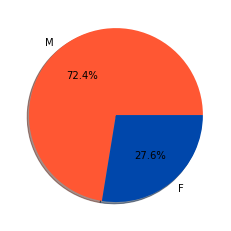

In [37]:
plt.pie(x=olympics_df["Sex"].value_counts(),labels=olympics_df["Sex"].value_counts().index,  autopct='%1.1f%%', shadow=True,colors=['#FF5733','#0047AB'])
plt.show()

Male participants are more than Female Participants but how do we observe if the number of female participants have increased over the years or not? Let's dive in.

In [38]:
#Grouping by year to find the number of female participants over time
female=(olympics_df.groupby(['Year'])['Sex'].value_counts().to_frame(name='Athletes').reset_index().query('Sex == "F"'))
female.head()

,Year,Sex,Athletes
2,1900,F,33
4,1904,F,16
6,1906,F,11
8,1908,F,47
10,1912,F,87


In [39]:
#Number of female participants over time
#Defining the trace
female_trace=go.Bar(x=female['Year'],y=female['Athletes'],name="Female",marker=dict(color="Red"))
data=[female_trace]
#Defining the layout
layout=dict(title='Number of female Olympians over time',xaxis=dict(title='Year',showticklabels=True),
        yaxis=dict(title='Number of athletes'),hovermode='closest')
#Combining data traces and layout settings to create the final plot.
fig=dict(data=data,layout=layout)
iplot(fig)

The participation of female athletes reached its highest point during the 2016 Vancouver Olympics and the least being during the 1900 Albertville Olympics. From our insights we can say that Female participation increased dramatically, and this trend started during the Cold War period (1945-1991).

#### Understanding the height and weight distribution of Athletes based on gender

In [40]:
#Height of Athletes
female_h = olympics_df[olympics_df['Sex']=='F']['Height']
male_h = olympics_df[olympics_df['Sex']=='M']['Height']
#Weight of Athletes
female_w = olympics_df[olympics_df['Sex']=='F']['Weight']
male_w = olympics_df[olympics_df['Sex']=='M']['Weight']

In [41]:
from plotly.subplots import make_subplots
#Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=('Athletes Height KDE plot', 'Athletes Weight KDE plot'))
#Add traces for height
fig.add_trace(go.Histogram(x=female_h, name='Female Height', histnorm='probability density'), row=1, col=1)
fig.add_trace(go.Histogram(x=male_h, name='Male Height', histnorm='probability density'), row=1, col=1)
#Add traces for weight
fig.add_trace(go.Histogram(x=female_w, name='Female Weight', histnorm='probability density'), row=2, col=1)
fig.add_trace(go.Histogram(x=male_w, name='Male Weight', histnorm='probability density'), row=2, col=1)
fig.update_layout(barmode='overlay')
fig.show()

Height Distribution: Women's height increases steadily from 160 to 175 cm, whereas men typically reach a maximum height of 175 cm.  

Weight Distribution: Women's weight peaks at 59 kg and 70 kg, whereas men's average weight is 70 kg.

#### What is the correlation of attributes like height and weight based on their sex?

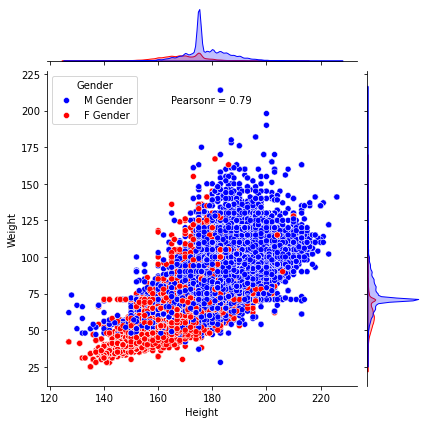

In [42]:
#Visualize the correlation between the height and weight of Olympic athletes based on their sex
#Correlation between weight and height
import scipy.stats as stats
pearson_corr = sns.jointplot(data=olympics_df, x="Height", y="Weight", hue="Sex", palette=['blue','red'])
# Customizing the legend
handles, labels = pearson_corr.ax_joint.get_legend_handles_labels()
pearson_corr.ax_joint.legend(handles=handles, labels=[item + " Gender" for item in labels], title='Gender', loc='upper left')
pearson,pearson_corr = stats.pearsonr(olympics_df['Height'], olympics_df['Weight'])
# Correlation between we
plt.annotate(f"Pearsonr = {pearson:.2f}", xy=(0.4, 0.9), xycoords="axes fraction") 
plt.show()

The pearson correlation between the height and weight of the athletes is observed to be 0.79 which indicates that it is a strong correlation and hence the weight and height with respect to the sex of atheletes is correlated.

#### Let's understand the common age participations between male and females to determine further analysis related to age groups

In [43]:
#Selecting the sex column of both male and females from the main df
female_a = olympics_df[olympics_df['Sex']=='F']['Age']
male_a = olympics_df[olympics_df['Sex']=='M']['Age']
#Create traces
trace_female = go.Histogram(x=female_a, name='Female Age', opacity=0.6)
trace_male = go.Histogram(x=male_a, name='Male Age', opacity=0.6)
#Create layout
layout = go.Layout(title='Athletes Age Distribution Plot',xaxis=dict(title='Age'),yaxis=dict(title='Frequency'))
#Create figure
fig = go.Figure(data=[trace_female, trace_male], layout=layout)
#Show plot
fig.show()

The age range of 20 to 30 years old is the common region covered for both genders, with the greatest number of participants from both groups falling within this age range.

#### How is the age distribution among athletes across different Sport?

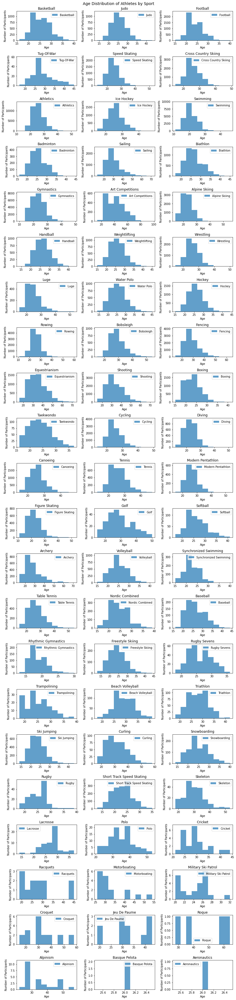

In [44]:
import matplotlib.pyplot as plt
import pandas as pd  
# Create subplots for age distribution by sport (optional)
if 'Sport' in olympics_df.columns:
    fig, axes = plt.subplots(nrows=int(olympics_df['Sport'].nunique() // 3), ncols=3, figsize=(12, 50)) 
    axes = axes.ravel()  # Flatten the subplot object for easier iteration
#For each top sport, a subset of the dataset corresponding to that sport is created
    for i, sport in enumerate(olympics_df['Sport'].unique()):
        subset = olympics_df[olympics_df['Sport'] == sport]
        axes[i].hist(subset['Age'], bins=10, label=sport, alpha=0.7)  # Adjust bin count as needed
        axes[i].set_title(sport)
        axes[i].legend()
        #axes[i].grid(True)
        axes[i].set_xlabel('Age') 
        axes[i].set_ylabel('Number of Participants')  
    plt.figtext(0.5, 1.0, 'Age Distribution of Athletes by Sport', ha='center', va='center', fontsize=14)
    plt.tight_layout()
    plt.show()

The age range for the top sports is found to be between 20 and 30 years old, while there are also a significant number of participants in the 40+ age range. The older age groups are observed to be participating in sports that require more mental strength. A deeper comprehension of the age dynamics within each sport category can help sport enthusiasts as well as researchers to identify trends and patterns in participation.

#### Since we know that there is equal number of participation between the younger age groups, how do we determine the older age groups participation trends? Let's find out

In [45]:
#Filter for athletes above 50 years old
filtered_df = olympics_df[olympics_df['Age'] > 40]
#Total number of athletes
total_athletes = len(olympics_df)
#Calculate the number of athletes above 50
athletes_above_40 = len(filtered_df)
# Participation rate (percentage)
participation_rate = (athletes_above_40 / total_athletes) * 100
print(f"Total number of athletes: {total_athletes}")
print(f"Number of athletes above the age 40: {athletes_above_40}")
print(f"Participation rate of athletes above the age 40: {participation_rate:.2f}%")

Total number of athletes: 269731
Number of athletes above the age 40: 6863
Participation rate of athletes above the age 40: 2.54%


In [46]:
#Grouping by age to find the sport popular among older age groups
athletes_above40=(olympics_df.groupby(['Age'])['Sport'].value_counts().to_frame(name='Athletes').reset_index().query('Age > 40'))
athletes_above40

,Age,Sport,Athletes
1459,41.0,Shooting,304
1460,41.0,Equestrianism,167
1461,41.0,Fencing,97
1462,41.0,Sailing,82
1463,41.0,Art Competitions,57
...,...,...,...
1834,81.0,Art Competitions,2
1835,84.0,Art Competitions,1
1836,88.0,Art Competitions,1
1837,96.0,Art Competitions,1


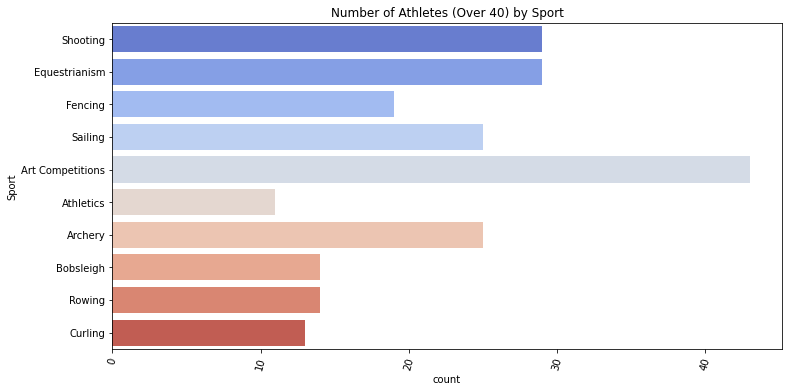

In [47]:
#to display only top 10 sports 
top_10_sports = athletes_above40['Sport'].value_counts().nlargest(10).index.tolist()
# Filter data for top 10 sports
athletes_above40_filtered = athletes_above40[athletes_above40['Sport'].isin(top_10_sports)]
#plotting 
plt.figure(figsize=(12, 6))
plt.tight_layout()
sns.countplot(athletes_above40_filtered['Sport'],palette='coolwarm')
plt.title('Number of Athletes (Over 40) by Sport')
plt.xticks(rotation=75);

An interesting observation is that individuals above 40 have been doing in Art competitions,Shooting,Equestrianism, Sailing,and Archery which proves our observation from the previous analysis that they participate in sports that require more mental strength.

#### What is the average Height and Weight of Olympiads for each Sport?

In [48]:
#Calculating the average of weight and height while grouping it by Sport
tmp=olympics_df.groupby(['Sport'])[['Height', 'Weight']].agg('mean')
df1=pd.DataFrame(tmp).reset_index()
tmp2=olympics_df.groupby(['Sport'])['ID'].count()#.to_frame(name='Count').reset_index()
df2=pd.DataFrame(tmp2).reset_index()
dataset=df1.merge(df2)
dataset

,Sport,Height,Weight,ID
0,Aeronautics,175.000000,71.000000,1
1,Alpine Skiing,173.905765,71.768717,8829
2,Alpinism,175.000000,71.000000,25
3,Archery,173.502571,70.200086,2334
4,Art Competitions,174.990720,71.057888,2263
...,...,...,...,...
61,Tug-Of-War,176.100000,78.529412,170
62,Volleyball,186.568449,78.605464,3404
63,Water Polo,182.129225,80.608684,3846
64,Weightlifting,169.517907,78.467615,3937


In [49]:
#Defining the hover text to create an interactive plot
hover_text = []
for index, row in dataset.iterrows():
    hover_text.append(('Sport: {}<br>'+'Number of athletes: {}<br>'+'Mean Height: {}<br>'+'Mean Weight: {}<br>').format(row['Sport'],
    row['ID'],round(row['Height'],2),round(row['Weight'],2)))
dataset['hover_text'] = hover_text

In [50]:
#Plotting
data = []
for sport in dataset['Sport']:
    ds = dataset[dataset['Sport']==sport]
    trace = go.Scatter(x = ds['Height'],y = ds['Weight'],name = sport,marker=dict(symbol='circle',sizemode='area',sizeref=10,
    size=ds['ID'],line=dict(width=2),),text = ds['hover_text'])
    data.append(trace)         
layout = go.Layout(title='Mean Height and Weight of Athletes (grouped by Sport)',xaxis=dict(title='Height [cm]',
         gridcolor='rgb(128, 128, 128)',zerolinewidth=1,ticklen=1,gridwidth=0.5,),yaxis=dict(title='Weight [kg]',
         gridcolor='rgb(128, 128, 128)',zerolinewidth=1,ticklen=1,gridwidth=0.5,),plot_bgcolor='rgb(254, 254, 254)',showlegend=True)
fig = dict(data = data, layout = layout)
iplot(fig)                      

Majority of Sports are visibly holding an average weight of around 65-79kgs and average height of around 173-177cms. The plot provides valuable insights into the physical attributes of athletes in various sports which unlocks the athletes participation trends with respect to the physical attributes.

### 2. Medal Distribution  

Medal Distribution analysis can help provide valuable insights into historical trends, identify areas of dominance, and potentially predict future Olympic performance.  

#### Let's dive into the distribution of medals across countries to understand the top winning countries by each category (Gold,Broze,Silver)

In [51]:
medals = olympics_df.groupby(['region', 'Medal'])['ID'].agg('count')
medals_df = pd.DataFrame(medals).reset_index()
medals_df

,region,Medal,ID
0,Afghanistan,Bronze,2
1,Afghanistan,No Medal,124
2,Albania,No Medal,70
3,Algeria,Bronze,8
4,Algeria,Gold,5
...,...,...,...
531,Zambia,Silver,1
532,Zimbabwe,Bronze,1
533,Zimbabwe,Gold,17
534,Zimbabwe,No Medal,301


In [52]:
dfG = medals_df[medals_df['Medal']=='Gold']
dfS = medals_df[medals_df['Medal']=='Silver']
dfB = medals_df[medals_df['Medal']=='Bronze']
def draw_map(dataset, title, colorscale):
    trace = go.Choropleth(locations = dataset['region'],locationmode='country names',z=dataset['ID'],text = dataset['region'],
    autocolorscale =False,reversescale = True,colorscale = colorscale,marker = dict(line = dict(color = 'rgb(0,0,0)',width = 0.5)),
    colorbar = dict(title = 'Medals',tickprefix = ''))
    data = [trace]
    layout = go.Layout(title = title,geo = dict(showframe = True,showlakes = False,showcoastlines = True,projection = dict(type = 'natural earth')))
    fig = dict( data=data, layout=layout)
    iplot(fig)

In [53]:
draw_map(dfG, "Countries with Gold Medals",'solar')
draw_map

<function __main__.draw_map(dataset, title, colorscale)>

United States, Russia, Germany are the nations with the highest number of gold medals won, while the Northwest region of South America and the African continent have the lowest records.

In [54]:
draw_map(dfS, "Countries with Silver Medals",'Greys')
draw_map

<function __main__.draw_map(dataset, title, colorscale)>

The nations with the most silver medals earned are the United States, Russia, and Germany; the regions with the fewest records are Southeast Asia, Africa, and the Northwest regions of South America.

In [55]:
draw_map(dfB, "Countries with Bronze Medals",'oranges')
draw_map

<function __main__.draw_map(dataset, title, colorscale)>

The countries of Southeast Asia and African regions with the Middle East countries have the fewest bronze medal records, while the United States, Russia, and Germany have the most number of medals won.  

##### What is the conclusion of this? The United States, Russia, and Germany are the nations with the most number of medals in each category, indicating that they have the best chance of winning; in contrast, Southeast Asia, Africa, and the Northwest parts of South America consistently have the fewest medals. If these nations send more participants, it may be possible to lower this in subsequent years and eventually raise the winning rate.

#### Who are the most successful athletes and what team do they represent?

In [56]:
#Creating a new column for counting the number of medals 
df_medal_holders = olympics_df[olympics_df.Medal!='No Medal']
df_medal_holders['Medal_Count'] = 1
df_medal_holders.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Medal_Count
3,4,Edgar Lindenau Aabye,M,34.0,175.0,71.0,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,Not Available,1
37,15,Arvo Ossian Aaltonen,M,30.0,175.0,71.0,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 200 metres Breaststroke,Bronze,Finland,Not Available,1
38,15,Arvo Ossian Aaltonen,M,30.0,175.0,71.0,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 400 metres Breaststroke,Bronze,Finland,Not Available,1
40,16,Juhamatti Tapio Aaltonen,M,28.0,184.0,85.0,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze,Finland,Not Available,1
41,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Individual All-Around,Bronze,Finland,Not Available,1


In [57]:
#Grouping based on the above code for further visualizing it
df_highest_medals = df_medal_holders[['Name', 'Year', 'Team', 'Medal_Count']].groupby(['Name','Year','Team']).sum().sort_values('Medal_Count', ascending=False)
df_highest_medals = df_highest_medals.groupby(['Name','Team']).sum().sort_values('Medal_Count', ascending=False).head(10)
df_highest_medals.reset_index(inplace=True)
df_highest_medals

,Name,Team,Medal_Count
0,"Michael Fred Phelps, II",United States,28
1,Larysa Semenivna Latynina (Diriy-),Soviet Union,18
2,Nikolay Yefimovich Andrianov,Soviet Union,15
3,Edoardo Mangiarotti,Italy,13
4,Takashi Ono,Japan,13
5,Ole Einar Bjrndalen,Norway,13
6,Borys Anfiyanovych Shakhlin,Soviet Union,13
7,Sawao Kato,Japan,12
8,"Dara Grace Torres (-Hoffman, -Minas)",United States,12
9,Ryan Steven Lochte,United States,12


In [58]:
#Visualizing the same to calculate the proportion
#Get athlete names and medal counts for the pie chart
athlete_names = df_highest_medals['Name']
medal_counts = df_highest_medals['Medal_Count']
fig = go.Figure(data=[go.Pie(labels=athlete_names, values=medal_counts, name='Total Medals', hole=0.4)])
fig.update_layout(title='Athletes with Most Medals(by Year and Team)',
   annotations=[go.layout.Annotation(text='Athletes', x=0.5, y=0.5, showarrow=False)])
fig.show()

With 28 medals won by Michael Fred Phelps continues to be the most successful athlete bringing in the most wins for United States.

#### Analyzing the distribution of medals each year and sport

In [59]:
# Grouping the data by Year and Medal type
grouped_data = df_medal_holders.groupby(['Year', 'Medal'])['Medal_Count'].sum().unstack()

# Creating an area chart
data = []
medal_colors = {'Gold': 'gold', 'Silver': 'grey', 'Bronze': 'brown'}

for medal_type in grouped_data.columns:
    data.append(go.Scatter(x=grouped_data.index, y=grouped_data[medal_type], fill='tozeroy', mode='lines', name=medal_type, line=dict(color=medal_colors[medal_type])))

# Setting up the layout
layout = go.Layout(title='Distribution of Medals Over the Years',
                   xaxis_title='Year',
                   yaxis_title='Medal Count',
                   showlegend=True)

# Creating the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

We can see that the distribution of medals increased dramatically after the 1960s, with a notably equal distribution among the three medals. A drop is also noted during the 1980s, which contributes to the subsequent years' increases and decreases in the distribution of medals. 

In [60]:
#Grouping the data by Sport and Medal type
grouped_data = df_medal_holders.groupby(['Sport', 'Medal'])['Medal_Count'].sum().unstack()
#To check if data is grouped by Year or Sport 
if 'Year' in grouped_data.columns:
    group_label = 'Year'
    title_prefix = 'Medal Distribution by Year'
else:
    group_label = 'Sport'
    title_prefix = 'Medal Distribution by Sport'
medal_colors = {'Gold': 'gold', 'Silver': 'silver', 'Bronze': '#cd7f32'}
data = []
for medal_type in grouped_data.columns:
    data.append(go.Bar(x=grouped_data.index,y=grouped_data[medal_type],name=medal_type,marker=dict(color=medal_colors[medal_type])))
layout = go.Layout(title=title_prefix,xaxis_title=group_label,yaxis_title='Medal Count',barmode='stack')
fig = go.Figure(data=data, layout=layout)
fig.show()

Swimming and rugby are closely behind in popularity, but athletics continues to be the most popular sport with the most medals given for the sport in all three categories.

#### What is the distribution of medals for each Gender?

In [61]:
medal_players=olympics_df[olympics_df["Medal"]!='No Medal']
medal_players.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
3,4,Edgar Lindenau Aabye,M,34.0,175.0,71.0,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,Not Available
37,15,Arvo Ossian Aaltonen,M,30.0,175.0,71.0,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 200 metres Breaststroke,Bronze,Finland,Not Available
38,15,Arvo Ossian Aaltonen,M,30.0,175.0,71.0,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 400 metres Breaststroke,Bronze,Finland,Not Available
40,16,Juhamatti Tapio Aaltonen,M,28.0,184.0,85.0,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze,Finland,Not Available
41,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Individual All-Around,Bronze,Finland,Not Available


In [62]:
import plotly.express as px
fig = px.histogram(medal_players,x="Medal",color="Sex",barmode='group',title='Total Medals with respect to Gender', 
      color_discrete_map={"M":"Black","F":"Red"},template='simple_white', opacity=1)
fig.show()

Although men have won significantly more medals than women in every category, when taking into account the participation ratio of men to women, women still have an equal contribution.

#### Does an athlete's age influence the type of medals they win (gold, silver, bronze)?

In [63]:
#medal_winners = olympics_df(subset=['Medal'])
non_medal_winners = olympics_df[olympics_df['Medal']=='No Medal']

In [64]:
gold_medals = olympics_df[(olympics_df['Medal'] == 'Gold')]
gold_medals.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
3,4,Edgar Lindenau Aabye,M,34.0,175.0,71.0,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,Not Available
42,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Team All-Around,Gold,Finland,Not Available
44,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Horse Vault,Gold,Finland,Not Available
48,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Pommelled Horse,Gold,Finland,Not Available
60,20,Kjetil Andr Aamodt,M,20.0,176.0,85.0,Norway,NOR,1992 Winter,1992,Winter,Albertville,Alpine Skiing,Alpine Skiing Men's Super G,Gold,Norway,Not Available


In [65]:
silver_medals = olympics_df[(olympics_df['Medal'] == 'Silver')]
silver_medals.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
63,20,Kjetil Andr Aamodt,M,22.0,176.0,85.0,Norway,NOR,1994 Winter,1994,Winter,Lillehammer,Alpine Skiing,Alpine Skiing Men's Downhill,Silver,Norway,Not Available
67,20,Kjetil Andr Aamodt,M,22.0,176.0,85.0,Norway,NOR,1994 Winter,1994,Winter,Lillehammer,Alpine Skiing,Alpine Skiing Men's Combined,Silver,Norway,Not Available
86,25,Alf Lied Aanning,M,24.0,175.0,71.0,Norway,NOR,1920 Summer,1920,Summer,Antwerpen,Gymnastics,"Gymnastics Men's Team All-Around, Free System",Silver,Norway,Not Available
92,30,Pepijn Aardewijn,M,26.0,189.0,72.0,Netherlands,NED,1996 Summer,1996,Summer,Atlanta,Rowing,Rowing Men's Lightweight Double Sculls,Silver,Netherlands,Not Available
106,38,Karl Jan Aas,M,20.0,175.0,71.0,Norway,NOR,1920 Summer,1920,Summer,Antwerpen,Gymnastics,"Gymnastics Men's Team All-Around, Free System",Silver,Norway,Not Available


In [66]:
bronze_medals = olympics_df[(olympics_df['Medal'] == 'Bronze')]
bronze_medals.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
37,15,Arvo Ossian Aaltonen,M,30.0,175.0,71.0,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 200 metres Breaststroke,Bronze,Finland,Not Available
38,15,Arvo Ossian Aaltonen,M,30.0,175.0,71.0,Finland,FIN,1920 Summer,1920,Summer,Antwerpen,Swimming,Swimming Men's 400 metres Breaststroke,Bronze,Finland,Not Available
40,16,Juhamatti Tapio Aaltonen,M,28.0,184.0,85.0,Finland,FIN,2014 Winter,2014,Winter,Sochi,Ice Hockey,Ice Hockey Men's Ice Hockey,Bronze,Finland,Not Available
41,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Individual All-Around,Bronze,Finland,Not Available
50,17,Paavo Johannes Aaltonen,M,32.0,175.0,64.0,Finland,FIN,1952 Summer,1952,Summer,Helsinki,Gymnastics,Gymnastics Men's Team All-Around,Bronze,Finland,Not Available


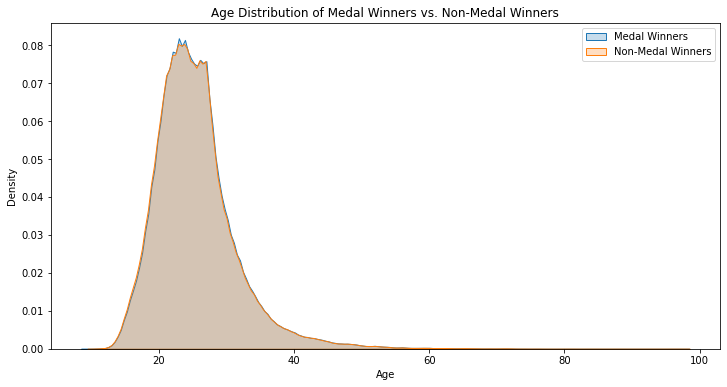

In [67]:
plt.figure(figsize=(12, 6))
sns.kdeplot(olympics_df['Age'], label='Medal Winners', shade=True)
sns.kdeplot(non_medal_winners['Age'], label='Non-Medal Winners', shade=True)
plt.title('Age Distribution of Medal Winners vs. Non-Medal Winners')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()
plt.show()

Regardless of the type of medal, the majority of medal winners, according to the analysis of the age distribution among them, were between the ages of 20 and 27. This age range appears to correspond with the years when athletes perform at their best in a variety of sports, underscoring the significance of youth and physical prime in in achieving Olympic success.

### 3. Trends in Sports  

By analyzing trends in Sports, one can uncover significant trends in sports played at the Olympic level and gain a deeper understanding of how sports evolve over time.

In [68]:
#Let's find out the unique number of sports played at the Olympics
unique_sports=olympics_df.Sport.unique()
n_unique_sports=len(unique_sports)
print("Unique sports played at the olympics:\n",unique_sports,"\n\nThe total number of unique sports played:",n_unique_sports)

Unique sports played at the olympics:
 ['Basketball' 'Judo' 'Football' 'Tug-Of-War' 'Speed Skating'
 'Cross Country Skiing' 'Athletics' 'Ice Hockey' 'Swimming' 'Badminton'
 'Sailing' 'Biathlon' 'Gymnastics' 'Art Competitions' 'Alpine Skiing'
 'Handball' 'Weightlifting' 'Wrestling' 'Luge' 'Water Polo' 'Hockey'
 'Rowing' 'Bobsleigh' 'Fencing' 'Equestrianism' 'Shooting' 'Boxing'
 'Taekwondo' 'Cycling' 'Diving' 'Canoeing' 'Tennis' 'Modern Pentathlon'
 'Figure Skating' 'Golf' 'Softball' 'Archery' 'Volleyball'
 'Synchronized Swimming' 'Table Tennis' 'Nordic Combined' 'Baseball'
 'Rhythmic Gymnastics' 'Freestyle Skiing' 'Rugby Sevens' 'Trampolining'
 'Beach Volleyball' 'Triathlon' 'Ski Jumping' 'Curling' 'Snowboarding'
 'Rugby' 'Short Track Speed Skating' 'Skeleton' 'Lacrosse' 'Polo'
 'Cricket' 'Racquets' 'Motorboating' 'Military Ski Patrol' 'Croquet'
 'Jeu De Paume' 'Roque' 'Alpinism' 'Basque Pelota' 'Aeronautics'] 

The total number of unique sports played: 66


In [69]:
sports=(olympics_df.groupby(['region'])['Sport'].value_counts().to_frame(name='Athletes').reset_index())
sports

,region,Sport,Athletes
0,Afghanistan,Wrestling,42
1,Afghanistan,Hockey,39
2,Afghanistan,Athletics,22
3,Afghanistan,Football,11
4,Afghanistan,Boxing,5
...,...,...,...
3686,Zimbabwe,Rowing,7
3687,Zimbabwe,Triathlon,3
3688,Zimbabwe,Alpine Skiing,2
3689,Zimbabwe,Equestrianism,1


Top 10 Most Popular Sports (Athlete Count):
Sport
Athletics               38624
Gymnastics              26707
Swimming                23195
Shooting                11448
Cycling                 10827
Fencing                 10735
Rowing                  10595
Cross Country Skiing     9133
Alpine Skiing            8829
Wrestling                7154
Name: Athletes, dtype: int64


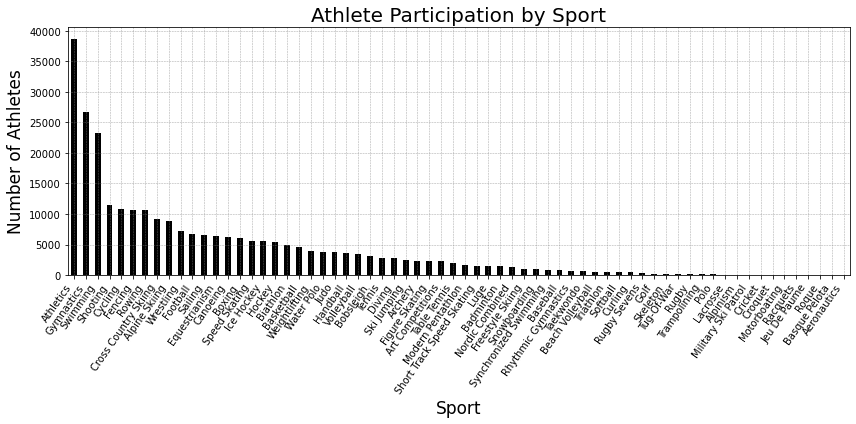

In [70]:
#Group data by 'Sport' and sum the number of athletes
athlete_count_per_sport=sports.groupby('Sport')['Athletes'].sum()
# Sorting by athlete count
athlete_count_per_sport=athlete_count_per_sport.sort_values(ascending=False)
#Print the results(top 10)
print("Top 10 Most Popular Sports (Athlete Count):")
print(athlete_count_per_sport.head(10)) 
#Visualization
plt.figure(figsize=(12, 6))
athlete_count_per_sport.plot(kind='bar', color='black')
plt.xlabel('Sport',fontsize=17)
plt.ylabel('Number of Athletes',fontsize=17)
plt.title('Athlete Participation by Sport',fontsize=20)
plt.rcParams['font.family'] = 'Arial'
plt.grid(color='grey', linestyle='--', linewidth=0.5, alpha=0.7)
plt.xticks(fontsize=10,rotation=55, ha='right')
plt.tight_layout()
plt.show()

#### Finding participation for a region across all sports

In [71]:
#Defining the region's National Olympic Committee (NOC) code
region_noc = 'IND'  
#Filtering the dataset for the specified region
region_df = olympics_df[olympics_df['NOC'] == region_noc]
#Counting the number of participants in each sport
participation_by_sport = region_df['Sport'].value_counts()
#Print the sports with higher participation for the region
print("Sports with Higher Participation for Region", region_noc)
print(participation_by_sport)

Sports with Higher Participation for Region IND
Sport
Hockey                  345
Athletics               269
Shooting                105
Wrestling               104
Gymnastics               88
Boxing                   56
Archery                  56
Football                 51
Tennis                   50
Weightlifting            40
Cycling                  40
Swimming                 36
Badminton                27
Table Tennis             26
Water Polo               19
Alpine Skiing            16
Judo                     15
Sailing                  12
Basketball               12
Equestrianism            10
Rowing                   10
Alpinism                  7
Luge                      4
Golf                      3
Cross Country Skiing      3
Art Competitions          2
Diving                    2
Name: count, dtype: int64


Given that it is the national sport of India, Hockey continues to be the most popular sport there followed by Athletics, Shooting etc.

#### What is the correlation of height and weight for each sport?

In [72]:
correlation_by_sport = olympics_df.groupby('Sport').apply(lambda x: x['Height'].corr(x['Weight']))
print(correlation_by_sport)

Sport
Aeronautics              NaN
Alpine Skiing       0.832360
Alpinism                 NaN
Archery             0.678185
Art Competitions    0.086560
                      ...   
Tug-Of-War          0.347144
Volleyball          0.845657
Water Polo          0.861813
Weightlifting       0.703949
Wrestling           0.822029
Length: 66, dtype: float64


In [73]:
#Calculating and printing the correlation coefficient for each sport
correlation_by_sport = olympics_df.groupby('Sport').apply(lambda x: x['Height'].corr(x['Weight']))
# Sorting and displaying the correlation coefficients for sports
sorted_correlation_by_sport=correlation_by_sport.sort_values(ascending=False)
pd.set_option('display.max_rows', None)
print(sorted_correlation_by_sport)

Sport
Motorboating                 1.000000
Gymnastics                   0.909313
Triathlon                    0.906274
Rugby Sevens                 0.899587
Rowing                       0.890014
Handball                     0.877161
Biathlon                     0.876970
Basketball                   0.872570
Speed Skating                0.872156
Beach Volleyball             0.871325
Water Polo                   0.861813
Short Track Speed Skating    0.856643
Cross Country Skiing         0.856534
Diving                       0.855037
Figure Skating               0.849351
Volleyball                   0.845657
Swimming                     0.844722
Ice Hockey                   0.843960
Freestyle Skiing             0.842551
Alpine Skiing                0.832360
Canoeing                     0.831268
Badminton                    0.828231
Tennis                       0.827373
Snowboarding                 0.824476
Wrestling                    0.822029
Hockey                       0.818043
Taekwo

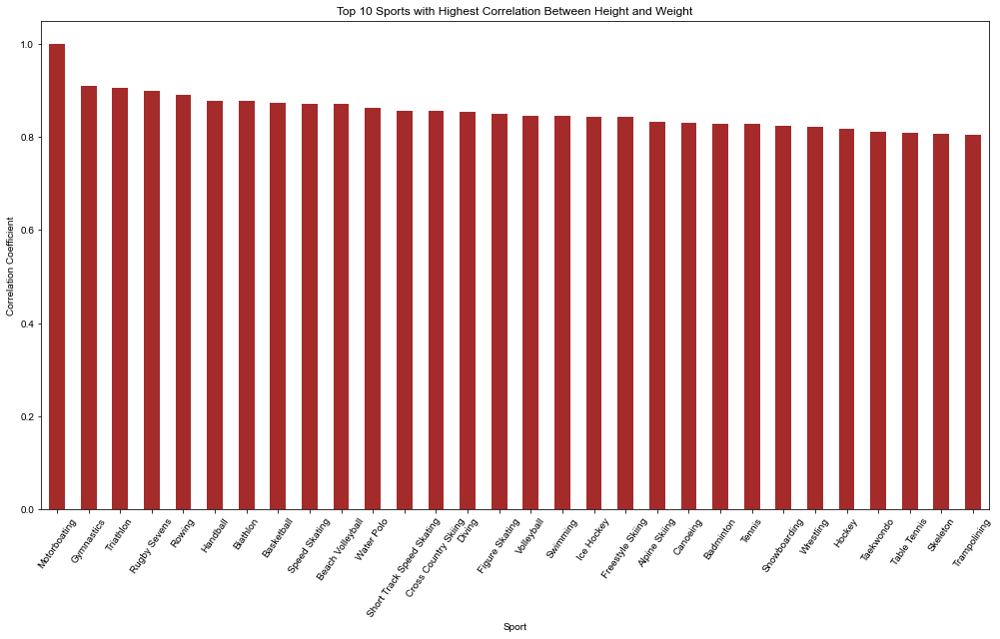

In [74]:
# Selecting the top 10 sports with the highest correlation and visualizing them
top_10_correlations = sorted_correlation_by_sport.head(30)

# Plotting the data using a bar chart
plt.figure(figsize=(17,9))
top_10_correlations.plot(kind='bar',color='brown')
plt.title('Top 10 Sports with Highest Correlation Between Height and Weight')
plt.xlabel('Sport')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=55)
plt.show()

The general correlation coefficient of height and weight is 0.787 like calculated before. However, this relationship varied significantly among different sports:  

High Correlation: Activities like Rugby Sevens, Gymnastics and Triathlons showed strong correlations, indicating that an athlete's height and weight are closely aligned in these activities.  

Low Correlation: Athletes' physical attributes varied more in sports like Tug-Of-War and Ski Jumping, which had lower correlations.  

Particular Cases: Because motorboating and aeronautics are two distinct sports due to their specific nature. Hence it is possible that certain correlation patterns are unique.  

#### Women Dominance: What is most and least played sport by women over the years?

In [75]:
#Analyzing the participation of women in different sports
participation_by_gender=olympics_df.groupby(['Sport', 'Sex']).size().unstack()
# Identifying sports with high female participation
preferred_sports_by_women=participation_by_gender.sort_values(by='F', ascending=False).head()
# Identifying sports with low female participation
less_preferred_sports_by_women = participation_by_gender.sort_values(by='F').head()
# Display results
print("Sports with higher female participation:", preferred_sports_by_women)
print("\n\nSports with lower female participation:", less_preferred_sports_by_women)

Sports with higher female participation: Sex                         F        M
Sport                                 
Athletics             11666.0  26958.0
Swimming               9850.0  13345.0
Gymnastics             9129.0  17578.0
Alpine Skiing          3398.0   5431.0
Cross Country Skiing   3385.0   5748.0


Sports with lower female participation: Sex              F       M
Sport                     
Alpinism       1.0    24.0
Motorboating   1.0    16.0
Croquet        6.0    13.0
Ski Jumping   30.0  2371.0
Skeleton      66.0   133.0


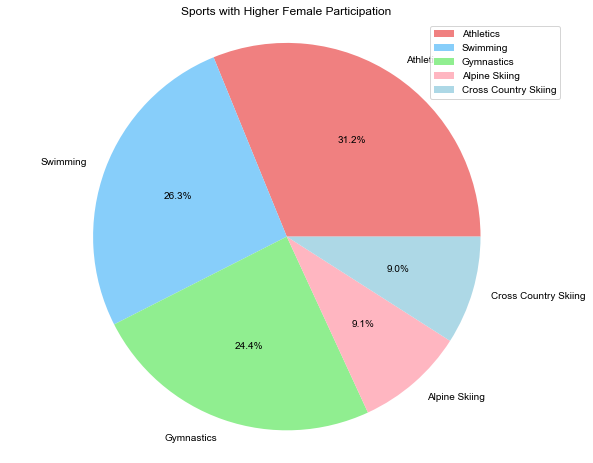

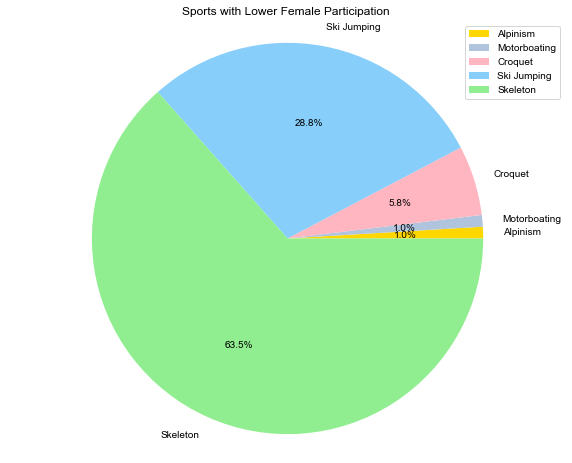

In [76]:
#Visulizing the same
#Extract sport names (assuming MultiIndex)
preferred_sports = preferred_sports_by_women.index.tolist()  
less_preferred_sports = less_preferred_sports_by_women.index.tolist()
#Get pie chart slice values (assuming 'F' column holds female participation count)
preferred_counts = preferred_sports_by_women['F'].to_numpy()
less_preferred_counts = less_preferred_sports_by_women['F'].to_numpy()
preferred_colors=['lightcoral', 'lightskyblue', 'lightgreen','lightpink','lightblue']  
less_preferred_colors=['gold', 'lightsteelblue', 'lightpink','lightskyblue','lightgreen']
#Plot pie chart for high female participation sports
plt.figure(figsize=(10,8))
plt.pie(preferred_counts, labels=preferred_sports, autopct="%1.1f%%",colors=preferred_colors)  # Adjust for desired decimal places in percentages
plt.title("Sports with Higher Female Participation")
plt.axis('equal')
plt.legend()
plt.show()
# Plot pie chart for low female participation sports
plt.figure(figsize=(10,8))
plt.pie(less_preferred_counts, labels=less_preferred_sports, autopct="%1.1f%%",colors=less_preferred_colors)  # Adjust for desired decimal places in percentages
plt.title("Sports with Lower Female Participation")
plt.axis('equal') 
plt.legend()
plt.show()

Preferred Sports: The sports with the highest female participation rates were gymnastics, swimming, and athletics.  
Less Preferred Sports: Women participated at lower rates in motorboating, croquet, and alpinism.  

### 4.Summer vs Winter Olympics

#### What is the number of sports played per season?

In [77]:
#let's check the years of the cities and the season. 
#We have both Summmer and Winter Olympics.We group them by Year and select Season and will obtain the number of athlets per event. 
sports_per_season=olympics_df.groupby(['Year', 'City','Season'])['Sport'].nunique()
sports_per_season=pd.DataFrame(data={'Sports': sports_per_season.values}, index=sports_per_season.index).reset_index()
sports_per_season.head()

,Year,City,Season,Sports
0,1896,Athina,Summer,9
1,1900,Paris,Summer,20
2,1904,St. Louis,Summer,18
3,1906,Athina,Summer,13
4,1908,London,Summer,24


In [78]:
#Visualizing the number of sports played per season over the time
#Separate sports based on the season into summer_df and winter_df
summer_df=sports_per_season[sports_per_season['Season']=='Summer'];winter_df=sports_per_season[sports_per_season['Season']=='Winter']
#Defining the trace
summer_trace=go.Bar(x=summer_df['Year'],y=summer_df['Sports'],name="Summer Games",marker=dict(color='rgb(238,23,11)',
            line=dict(color='red',width=2),opacity=0.7),text=summer_df['City'])
winter_trace=go.Bar(x=winter_df['Year'],y=winter_df['Sports'],name="Winter Games",marker=dict(color='rgb(11,23,245)',
            line=dict(color='blue',width=2),opacity=0.7),text=winter_df['City'])
#Defining the layout
data=[summer_trace,winter_trace]
layout=dict(title='Sports per Olympic edition',xaxis=dict(title='Year', showticklabels=True),yaxis=dict(title='Number of sports'),
        hovermode = 'closest',barmode='stack')
#Combining data traces and layout settings to create the final plot.
fig = dict(data=data, layout=layout)
iplot(fig)

Ten sports were competed at the inaugural Winter Olympics in 1924 in Chamonix. Although the games have since advanced, the number of sports competed in the Winter Olympics is far smaller than in the Summer Olympics.

#### What is the difference in the participation of athletes in Summer vs Winter Olympics over the years?

In [79]:
#Grouping it accordingly
athletes_per_season=olympics_df.groupby(['Year'])['Season'].value_counts()
athletes_per_season=pd.DataFrame(data={'Athletes': athletes_per_season.values},index=athletes_per_season.index).reset_index()
athletes_per_season.head()

,Year,Season,Athletes
0,1896,Summer,380
1,1900,Summer,1898
2,1904,Summer,1301
3,1906,Summer,1733
4,1908,Summer,3069


In [80]:
#Differntaing the season with respect to Athlets per Olympic Year .

#Separate athletes based on the season into summer_df and winter_df
summer_df=athletes_per_season[athletes_per_season['Season']=='Summer'];winter_df=athletes_per_season[athletes_per_season['Season']=='Winter']
#Defining the trace
summer_trace = go.Scatter(x = summer_df['Year'],y = summer_df['Athletes'],name="Summer Games",marker=dict(color="Red"),
    mode = "markers+lines")
winter_trace = go.Scatter(x = winter_df['Year'],y = winter_df['Athletes'],name="Winter Games",marker=dict(color="Blue"),
    mode = "markers+lines")
data = [summer_trace, winter_trace]
#Defining the layout
layout = dict(title = 'Athletes Participation in Summer vs Winter Olympics',xaxis = dict(title = 'Year', showticklabels=True),
    yaxis = dict(title = 'Number of athlets'),hovermode = 'closest')
#Combining data traces and layout settings to create the final plot
fig = dict(data=data, layout=layout)
iplot(fig)

By utilizing scatter plots,it provides a clear comparison between the number of athletes involved in the two types of Olympic Games. When comparing the Summer Olympics to the Winter Olympics, we can see that the trend of participation is increasing in Summer Olympics. Additionally, it is noted that while athlete participation in the winter Olympics has been steadily increasing, that of the summer Olympics has also had its significant amount of decreases in participation and hence the graph is not steadily increasing.

#### Let's analyse the Athlete participation for each sport based on edition

In [81]:
athletes_per_sport=olympics_df.groupby(['Year', 'City','Season'])['Sport'].value_counts()
athletes_per_sport=pd.DataFrame(data={'Athletes': athletes_per_sport.values}, index=athletes_per_sport.index).reset_index()
athletes_per_sport.head(3)

,Year,City,Season,Sport,Athletes
0,1896,Athina,Summer,Athletics,106
1,1896,Athina,Summer,Gymnastics,97
2,1896,Athina,Summer,Shooting,65


In [82]:
sports=(olympics_df.groupby(['Sport'])['Sport'].nunique()).index

In [83]:
def draw_trace(dataset, sport):
    summer_df=dataset[dataset['Sport']==sport]
    trace=go.Box(x=summer_df['Athletes'],name=sport,marker=dict(line=dict(color='black',width=0.8)),text=summer_df['City'],orientation='h')
    return trace

def draw_group(dataset, title,height=800):
    data = list()
    for sport in sports:
        data.append(draw_trace(dataset, sport))
    layout=dict(title=title,xaxis=dict(title='Number of athletes',showticklabels=True),yaxis=dict(title='Sport',showticklabels=True,tickfont=dict(
    family='Old Standard TT, serif',size=8,color='black')),hovermode='closest',showlegend=False,width=800,height=height)
    fig = dict(data=data, layout=layout)
    iplot(fig)

#select only Summer Olympics
df_S=athletes_per_sport[athletes_per_sport['Season']=='Summer']
# draw the boxplots for the Summer Olympics
draw_group(df_S, "Athletes per Sport (Summer Olympics)")

The most popular sport in Summer Olympics is Athletics, Gymnastics and Swimming garnering around 2000 Athletes each.

In [84]:
#Select only Winter Olympics
df_W = athletes_per_sport[athletes_per_sport['Season']=='Winter']
#Draw the boxplots for the Summer Olympics
draw_group(df_W, "Athletes per Sport (Winter Olympics)",600)

The most popular sport in Winter Olympics is Cross Country Skiing, Alpine Skiing and Biathlong garnering nearly 1000 participants.

#### How many athletes participated in the winter and summer olympics per year and sport?

In [85]:
#Heat Map
pivot=pd.pivot_table(df_S,values="Athletes",index=["Year"],columns=["Sport"],fill_value=0)
res=pivot.values

In [86]:
trace=go.Heatmap(z=res,y=list(pivot.index),x=list(pivot.columns),colorscale='Reds',reversescale=False)
data=[trace]
layout=dict(title="Number of athletes per year and sport (Summer Olympics)",xaxis=dict(title='Sport',showticklabels=True,
       tickangle=45,tickfont=dict(size=10,color='black')),yaxis=dict(title='Year', showticklabels=True, tickfont=dict(
       size=10,color='black')),hovermode='closest',showlegend=False,width=1000,height=800)
fig = dict(data=data, layout=layout)
iplot(fig)

In [87]:
pivot=pd.pivot_table(df_W, values="Athletes",index=["Year"], columns=["Sport"], fill_value=0)
res=pivot.values

In [88]:
trace = go.Heatmap(z=res,y=list(pivot.index),x=list(pivot.columns),colorscale='Blues',reversescale=True)
data=[trace]
layout=dict(title="Number of Athletes per Year and Sport (Winter Olympics)",xaxis=dict(title='Sport',showticklabels=True,
       tickangle=30,tickfont=dict(size=8,color='black')),yaxis=dict(title='Year',showticklabels=True,tickfont=dict(size=10,
    color='black')),hovermode = 'closest',showlegend=False,width=800,height=800)
fig = dict(data=data, layout=layout)
iplot(fig)

#### Which countries participated most in each of the seasons?

In [89]:
countries=olympics_df.groupby(['region', 'Season'])['Year'].nunique()
countries=pd.DataFrame(data={'Editions': countries.values}, index=countries.index).reset_index()
countries.head()

,region,Season,Editions
0,Afghanistan,Summer,14
1,Albania,Summer,8
2,Albania,Winter,3
3,Algeria,Summer,13
4,Algeria,Winter,3


In [90]:
dfS=countries[countries['Season']=='Summer']; dfW=countries[countries['Season']=='Winter']
def draw_map(dataset, title, colorscale, reversescale=False):
    trace=go.Choropleth(locations=dataset['region'],locationmode='country names',z=dataset['Editions'],text=dataset['region'],
    autocolorscale=False,reversescale=reversescale,colorscale=colorscale,marker=dict(line=dict(color='rgb(0,0,0)',width=0.5)),
    colorbar = dict(title = 'Editions',tickprefix = ''))
    data = [trace]
    layout=go.Layout(title=title,geo=dict(showframe=True,showlakes=False,showcoastlines=True,projection=dict(type='orthographic')))
    fig = dict( data=data, layout=layout )
    iplot(fig)
draw_map(dfS, 'Olympic countries (Summer games)', "Reds")

In [91]:
draw_map(dfW, 'Olympic countries (Winter games)', "Blues", False)

Summer Olympics: Italy, France, USA, Canada  
Winter Olympics: Poland, Sweden, France, Norway

#### Medal Tally across editions

In [92]:
df_winter = olympics_df[olympics_df['Season'] == 'Winter']
df_winter['Medal'].value_counts()

Medal
No Medal    42869
Gold         1913
Silver       1896
Bronze       1886
Name: count, dtype: int64

In [93]:
df_summer = olympics_df[olympics_df['Season'] == 'Summer']
df_summer['Medal'].value_counts()

Medal
No Medal    187090
Gold         11456
Bronze       11409
Silver       11212
Name: count, dtype: int64

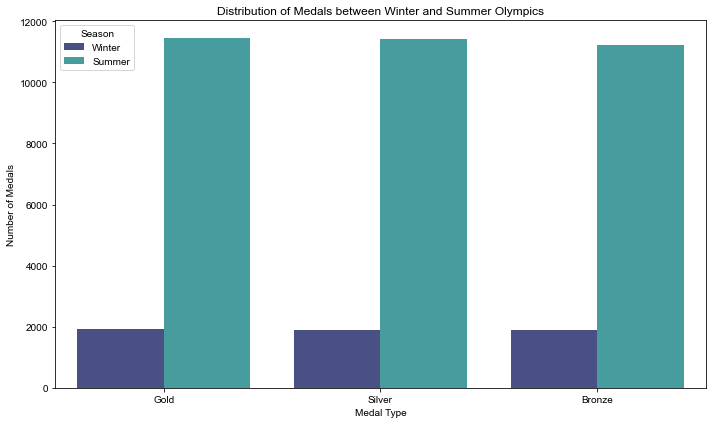

In [94]:
#Count the number of medals for each season and medal type
winter_medal_counts = df_winter[df_winter['Medal'] != 'No Medal']['Medal'].value_counts()
summer_medal_counts = df_summer[df_summer['Medal'] != 'No Medal']['Medal'].value_counts()
#Combine the counts into a DataFrame
medal_counts = pd.DataFrame({'Medal Type': winter_medal_counts.index, 'Winter': winter_medal_counts.values, 'Summer': summer_medal_counts.values})
#Melt the DataFrame to long format
medal_counts = medal_counts.melt(id_vars='Medal Type', var_name='Season', value_name='Number of Medals')
#Plotting the grouped bar chart
plt.figure(figsize=(10, 6))
sns.barplot(data=medal_counts, x='Medal Type', y='Number of Medals', hue='Season', palette='mako')
#Adding labels and title
plt.xlabel('Medal Type')
plt.ylabel('Number of Medals')
plt.title('Distribution of Medals between Winter and Summer Olympics')
plt.legend(title='Season')
plt.tight_layout()
plt.show()

As summer olympics has more number of participants the medal distribution is also correlated and hence it has more medals compared to winter olympics.

### 5.Social Factors  

Analyzing social factors can provide valuable insights into a country's Olympic performance. Here's how you can uncover these factors based on our analysis.

#### Total medals won by gender


In [95]:
total_medals_by_gender = olympics_df.groupby('Sex')['Medal'].count()
print("Total Medals Won by Gender:")
print(total_medals_by_gender)

Total Medals Won by Gender:
Sex
F     74378
M    195353
Name: Medal, dtype: int64


#### Medal distribution over time by gender


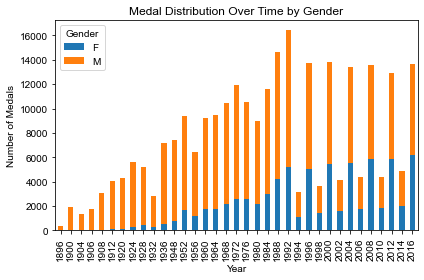

In [96]:
medals_by_year_gender = olympics_df.groupby(['Year', 'Sex'])['Medal'].count().unstack()
medals_by_year_gender.plot(kind='bar', stacked=True)
plt.title('Medal Distribution Over Time by Gender')
plt.xlabel('Year')
plt.ylabel('Number of Medals')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

#### Top female and male athletes


In [97]:
top_female_athletes = olympics_df[olympics_df['Sex'] == 'F'].groupby('Name')['Medal'].count().nlargest(5)
top_male_athletes = olympics_df[olympics_df['Sex'] == 'M'].groupby('Name')['Medal'].count().nlargest(5)
print("\nTop Female Athletes:")
print(top_female_athletes)
print("\nTop Male Athletes:")
print(top_male_athletes)


Top Female Athletes:
Name
Oksana Aleksandrovna Chusovitina    29
Gabriella Paruzzi                   25
Daniele Matias Hyplito              24
Franziska van Almsick               23
Seiko Hashimoto (-Ishizaki)         22
Name: Medal, dtype: int64

Top Male Athletes:
Name
Heikki Ilmari Savolainen    39
Joseph "Josy" Stoffel       38
Ioannis Theofilakis         36
Takashi Ono                 33
Alexandros Theofilakis      32
Name: Medal, dtype: int64


#### Gender distribution in top countries


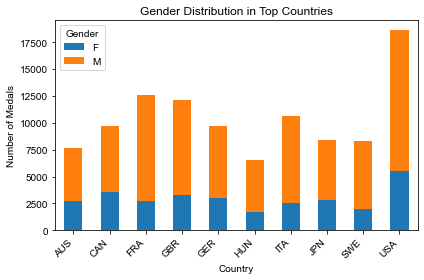

In [98]:
top_countries = olympics_df['NOC'].value_counts().head(10)
top_countries_medals = olympics_df[olympics_df['NOC'].isin(top_countries.index)]
medals_by_gender_top_countries = top_countries_medals.groupby(['NOC', 'Sex'])['Medal'].count().unstack()
medals_by_gender_top_countries.plot(kind='bar', stacked=True)
plt.title('Gender Distribution in Top Countries')
plt.xlabel('Country')
plt.ylabel('Number of Medals')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

Even if the number of women participating has grown over time, leading nations like the USA and Japan can send in a higher number of female participants, setting an example for society. 

#### Countries that have the best male female ratio

In [99]:
mf_ratio = pd.pivot_table(index = 'region', columns = 'Sex', values = 'Name', data =olympics_df, aggfunc = 'nunique')
mf_ratio.head()

Sex,F,M
region,,
Afghanistan,4,99
Albania,16,29
Algeria,55,318
American Samoa,5,24
Andorra,18,43


In [100]:
mf_ratio['MRatio'] = ((mf_ratio['M'] / mf_ratio['M'])  * 100).astype(int)
mf_ratio['FRatio'] = ((mf_ratio['F'] / mf_ratio['M'])  * 100).astype(int)
mf_ratio['Overall'] = round(mf_ratio['MRatio'] / mf_ratio['FRatio'], 2)

In [101]:
mf_ratio[(mf_ratio['Overall'] > 0.90) & (mf_ratio['Overall'] < 1.1)]

Sex,F,M,MRatio,FRatio,Overall
region,,,,,
China,1438,1423,100,101,0.99
Guinea-Bissau,7,7,100,100,1.00
Marshall Islands,6,6,100,100,1.00
North Korea,198,195,100,101,0.99
Palau,11,10,100,110,0.91


Countries like China, Guinea-Bissau, Marhsall Islands, North Korea and Palau place the highest in sending equal number of participants with respect to gender.

#### Does hosting the olympics improve Performance?

In [102]:
# # Identifying the host city for each Olympic year
# host_cities = olympics_df[['Year', 'City']]
# merged_data = pd.merge(olympics_df, host_cities, on=['Year', 'City'])
# merged_data

In [103]:
# Define a function to map host cities to host countries
def host_country(city):
    host_cities = {
        "Rio de Janeiro": "Brazil",
        "London": "United Kingdom",
        "Beijing": "China",
        "Athina": "Greece",
        "Sydney": "Australia", "Melbourne": "Australia",
        "Atlanta": "United States", "Los Angeles": "United States", "St. Louis": "United States",
        "Barcelona": "Spain",
        "Seoul": "South Korea",
        "Moskva": "Russia",
        "Montreal": "Canada",
        "Munich": "Germany", "Berlin": "Germany",
        "Mexico City": "Mexico",
        "Tokyo": "Japan",
        "Roma": "Italy",
        "Paris": "France",
        "Helsinki": "Finland",
        "Amsterdam": "Netherlands",
        "Antwerpen": "Belgium",
        "Stockholm": "Sweden"
    }
    return host_cities.get(city, "Other")

# Apply the function to create a new column 'Host_Country' in the athlete data
olympics_df['Host_Country'] = olympics_df['City'].apply(host_country)

# Calculate the total number of medals each country won each year
# Filtering out rows with no medal information
medalists = olympics_df[olympics_df.Medal!='No Medal']
# Grouping by Year, NOC, and Host_Country, and counting the number of medals
medal_counts = medalists.groupby(['Year', 'Team', 'Host_Country']).size().reset_index(name='Medal_Count')

medal_counts.head(20)

,Year,Team,Host_Country,Medal_Count
0,1896,Australia,Greece,2
1,1896,Australia/Great Britain,Greece,2
2,1896,Austria,Greece,5
3,1896,Denmark,Greece,6
4,1896,Ethnikos Gymnastikos Syllogos,Greece,2
5,1896,France,Greece,11
6,1896,Germany,Greece,31
7,1896,Great Britain,Greece,7
8,1896,Great Britain/Germany,Greece,2
9,1896,Greece,Greece,44


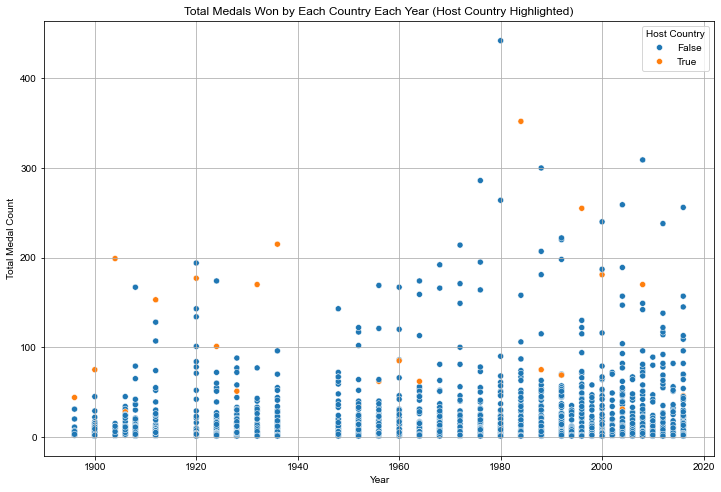

In [104]:
# Creating a scatter plot to visualize the medal counts
# We'll color the points based on whether the country was the host that year

# Create a boolean column to indicate if the country was the host that year
medal_counts['Is_Host'] = medal_counts['Team'] == medal_counts['Host_Country']

# Plotting the total number of medals for each country by year, highlighting host countries
plt.figure(figsize=(12, 8))
sns.scatterplot(data=medal_counts, x='Year', y='Medal_Count', hue='Is_Host', alpha=1)
plt.title('Total Medals Won by Each Country Each Year (Host Country Highlighted)')
plt.xlabel('Year')
plt.ylabel('Total Medal Count')
plt.legend(title='Host Country')
plt.grid(True)
plt.show()

Early Years (Upto 1940): Host nations regularly achieved the top ranks, often taking the top spot.   

Mid Years (1945–1980): There was less of a continuous trend, with host nations not always coming in first.  

Recent Years (Post 1990): Host countries generally performed well, often ranking in the top 3, with a few exceptions.  

These results imply that, although serving as the host nation can boost performance, it is not guranteed to win the most medals. Geopolitical, social, and economic factors,play crucial roles in a nation's Olympic success.  